In [49]:
from keras.optimizers import RMSprop
from PIL import Image
import PIL
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from keras.utils import np_utils
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D
from keras.layers import Activation, Dense, Flatten, Dropout, BatchNormalization, MaxPool2D 
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from keras import backend as K
from sklearn.datasets import load_files
from google.colab import drive
drive.mount('/content/drive')
import cv2
from sklearn.metrics import classification_report,confusion_matrix
from keras.callbacks import ReduceLROnPlateau
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.datasets as datasets
import torch.optim as optim
# рисование:
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
import collections
from tensorflow.keras.models import load_model
from torchvision.transforms import ToTensor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.utils import load_img
from sklearn.metrics import precision_score, recall_score, f1_score
import tensorflow as tf

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [67]:
train_dir = '/content/drive/MyDrive/Енисейский_вариант2/Train'
test_dir = '/content/drive/MyDrive/Енисейский_вариант2/Test'
def load_dataset(path):
    data = load_files(path)
    files = np.array(data['filenames'])
    targets = np.array(data['target'])
    target_labels = np.array(data['target_names'])
    return files,targets,target_labels
  
def convert_image_to_array(files, desired_width, desired_height):
    images_as_array = []
    for file in files:
        image = load_img(file, target_size=(desired_width, desired_height))
        image = img_to_array(image)
        images_as_array.append(image)
    return images_as_array

In [68]:
x_train, y_train,target_labels = load_dataset(train_dir)
x_test, y_test, _ = load_dataset(test_dir)

In [69]:
print('Training set size : ' , x_train.shape[0])
print('Testing set size : ', x_test.shape[0])

Training set size :  1230
Testing set size :  220


In [70]:
no_of_classes = len(np.unique(y_train))
print("Classes: ", no_of_classes)

Classes:  42


In [71]:
y_train = np_utils.to_categorical(y_train,no_of_classes)
y_test = np_utils.to_categorical(y_test,no_of_classes)

In [72]:
x_test,x_valid = x_test[120:],x_test[:120]
y_test,y_valid = y_test[120:],y_test[:120]
print('Vaildation X : ',x_valid.shape)
print('Vaildation y :',y_valid.shape)
print('Test X : ',x_test.shape)
print('Test y : ',y_test.shape)

Vaildation X :  (120,)
Vaildation y : (120, 42)
Test X :  (100,)
Test y :  (100, 42)


In [73]:
x_train = np.array(convert_image_to_array(x_train, 100, 100))
print('Training set shape:', x_train.shape)

x_valid = np.array(convert_image_to_array(x_valid, 100, 100))
print('Validation set shape:', x_valid.shape)

x_test = np.array(convert_image_to_array(x_test, 100, 100))
print('Test set shape:', x_test.shape)

Training set shape: (1230, 100, 100, 3)
Validation set shape: (120, 100, 100, 3)
Test set shape: (100, 100, 100, 3)


In [74]:
x_train = x_train.astype('float32')/255
x_valid = x_valid.astype('float32')/255
x_test = x_test.astype('float32')/255

In [75]:
def precision(y_true, y_pred):
    tp = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    predicted_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_pred, 0, 1)))
    precision = tp / (predicted_positives + tf.keras.backend.epsilon())
    return precision

def recall(y_true, y_pred):
    tp = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    possible_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true, 0, 1)))
    recall = tp / (possible_positives + tf.keras.backend.epsilon())
    return recall

def f1_score_metric(y_true, y_pred):
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    f1_score_val = 2 * (p * r) / (p + r + tf.keras.backend.epsilon())
    return f1_score_val

In [76]:
model = Sequential()
model.add(Conv2D(filters = 16, kernel_size = 2,input_shape=(100,100,3),padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters = 32,kernel_size = 2,activation= 'relu',padding='same'))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters = 64,kernel_size = 2,activation= 'relu',padding='same'))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters = 128,kernel_size = 2,activation= 'relu',padding='same'))
model.add(MaxPooling2D(pool_size=2))

model.add(Dropout(0.3))
model.add(Flatten())
model.add(Dense(150))
model.add(Activation('relu'))
model.add(Dropout(0.3))
model.add(Dense(42,activation = 'softmax'))
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 100, 100, 16)      208       
                                                                 
 activation_10 (Activation)  (None, 100, 100, 16)      0         
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 50, 50, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 50, 50, 32)        2080      
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 25, 25, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 25, 25, 64)       

In [77]:
batch_size = 16
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath = 'cnn_from_scratch_runes.hdf5', verbose = 1, save_best_only = True)

history = model.fit(x_train, y_train, batch_size=32, epochs=22, validation_data=(x_valid, y_valid), callbacks = [checkpointer], shuffle=True)

score = model.evaluate(x_test, y_test, verbose=0)
test_loss = score[0]
test_accuracy = score[1]

print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)


Epoch 1/22
39/39 [==============================] - ETA: 0s - loss: 3.7201 - accuracy: 0.0398
Epoch 1: val_loss improved from inf to 3.72081, saving model to cnn_from_scratch_runes.hdf5
39/39 [==============================] - 13s 298ms/step - loss: 3.7201 - accuracy: 0.0398 - val_loss: 3.7208 - val_accuracy: 0.0250
Epoch 2/22
39/39 [==============================] - ETA: 0s - loss: 3.6667 - accuracy: 0.0472
Epoch 2: val_loss improved from 3.72081 to 3.69353, saving model to cnn_from_scratch_runes.hdf5
39/39 [==============================] - 11s 288ms/step - loss: 3.6667 - accuracy: 0.0472 - val_loss: 3.6935 - val_accuracy: 0.0250
Epoch 3/22
39/39 [==============================] - ETA: 0s - loss: 3.3993 - accuracy: 0.1431
Epoch 3: val_loss improved from 3.69353 to 3.32816, saving model to cnn_from_scratch_runes.hdf5
39/39 [==============================] - 13s 330ms/step - loss: 3.3993 - accuracy: 0.1431 - val_loss: 3.3282 - val_accuracy: 0.2000
Epoch 4/22
39/39 [====================

In [64]:
import tensorflow as tf
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import networkx as nx

from tensorflow.keras.models import load_model


def recognize_symbols(image_path):
    symbol_map = {'1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, '11': 11, '12': 12, '13': 13, '14': 14, '15': 15, '16': 16, '17': 17, '18': 18, '19': 19, '20': 20, '21': 21, '22': 22, '23': 23, '24': 24, '25': 25, '26': 26, '27': 27, '28': 28, '29': 29, '30': 30, '31': 31, '32': 32, '33': 33, '34': 34, '35': 35, '36': 36, '37': 37, '38': 38, '39': 39, '40': 40, '41': 41, '42': 42}
    class_dict = {1:'mi', 2:'a', 3:'b(e)', 4:'b', 5:'j', 6:'g', 7:'d', 8:'d', 9:'u', 10:'ko',11:'z', 12:'j', 13:'j(i)', 14:'q', 15:'k', 16:'l', 17:'ng(l)', 18:'lt', 19:'m', 20:'n',21:'n', 22:'nt', 23:'l(ng)', 24:'n~', 25:'nd', 26:'nc', 27:'u', 28:'q(o/u)', 29:'p', 30:'r',31:'r', 32:':', 33:'s', 34:'s', 35:'t', 36:'t', 37:'c', 38:'s', 39:'s', 40:'i',41:'qi', 42:'a'}
    
    model = load_model('cnn_from_scratch_runes.hdf5')
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sharp_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
    sharp_image = cv2.filter2D(gray, -1, sharp_kernel)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(sharp_image)
    _, binary = cv2.threshold(enhanced_image, 127, 255, cv2.THRESH_BINARY_INV)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    dilated = cv2.dilate(binary, kernel, iterations=1)
    closed = cv2.morphologyEx(dilated, cv2.MORPH_CLOSE, kernel, iterations=1)
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    result_image = image.copy()
    symbol_results = []
    predicted_symbols = []
    recognized_symbols = []
    for contour in contours:
      x, y, w, h = cv2.boundingRect(contour)
      padding = 10
      x -= padding
      y -= padding
      w += padding * 2
      h += padding * 2
      max_width = 150
      max_height = 150
      if w > max_width:
        w = max_width
      if h > max_height:
        h = max_height

      min_width = 20
      min_height = 100
      if w < min_width:
        w = min_width
      if h < min_height:
        h = min_height
      symbol_roi = image[y:y+h, x:x+w]
      if symbol_roi.size > 0:
        # Улучшение качества символа
        symbol_roi_gray = cv2.cvtColor(symbol_roi, cv2.COLOR_BGR2GRAY)
        symbol_roi_sharp = cv2.filter2D(symbol_roi_gray, -1, sharp_kernel)
        symbol_roi_enhanced = clahe.apply(symbol_roi_sharp)
        # Подготовка символа для подачи на вход модели
        symbol_roi_resized = cv2.resize(symbol_roi_enhanced, (100, 100))
        symbol_roi_resized = symbol_roi_resized / 255.0
        symbol_roi_resized = np.expand_dims(symbol_roi_resized, axis=2)  # Добавление оси для каналов
        # Расширение размерности и повторение значений
        symbol_roi_resized = tf.repeat(symbol_roi_resized, repeats=3, axis=2)
        symbol_roi_resized = np.expand_dims(symbol_roi_resized, axis=0)  # Добавление оси для батча
        cv2_imshow(symbol_roi)

        # Запрос у пользователя о правильности распознавания символа
        user_input = input("Символ распознан правильно? (y/n): ")

        if user_input == 'y':
            # Применение модели для распознавания символа несколько раз
            predictions = []
            num_predictions = 5  # Количество предсказаний для каждого символа
            for _ in range(num_predictions):
                prediction = model.predict(symbol_roi_resized)
                predictions.append(np.argmax(prediction))

            # Поиск наиболее частого предсказания
            predicted_label = max(set(predictions), key=predictions.count)

            # Добавление символа, его координат и предсказанного значения в список
            predicted_symbols.append((symbol_roi, (x, y, w, h), predicted_label))
            
            recognized_symbols.append((target_labels[predicted_label], (x, y, w, h)))
            # Запись информации о правильности распознавания символа
            symbol_results.append((x, y, w, h, True))

            # Отображение выделенного символа на изображении результата
            cv2.rectangle(result_image, (x, y), (x+w, y+h), (0, 255, 0), 2)
            recognized_symbols.sort(key=lambda x: x[1][0])
        else:
            symbol_results.append((x, y, w, h, False))
   
        # Отображение и сохранение результата
    cv2_imshow(result_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    cv2.imwrite('result.jpg', result_image)
    # Вывод символов с предсказанными значениями
    for symbol, coords, predicted_label in predicted_symbols:
      print("_________________________________________________")
      cv2_imshow(symbol)
      print("Предсказанное значение символа:", target_labels[predicted_label])
    # Подсчет парной встречаемости символов
    pair_counts = {}
    for i in range(len(recognized_symbols)-1):
      for j in range(i+1, len(recognized_symbols)):
        symbol1, symbol2 = recognized_symbols[i][0], recognized_symbols[j][0]
        if symbol1 < symbol2:
            pair = (symbol1, symbol2)
        else:
            pair = (symbol2, symbol1)
        if pair in pair_counts:
            pair_counts[pair] += 1
        else:
            pair_counts[pair] = 1
    classes = list(map(lambda x: x[0], recognized_symbols))
    classes.reverse()
    new_classes = [class_dict[int(c)] for c in classes]
    print(classes, "Возможный перевод: ", "".join(new_classes))
    return recognized_symbols



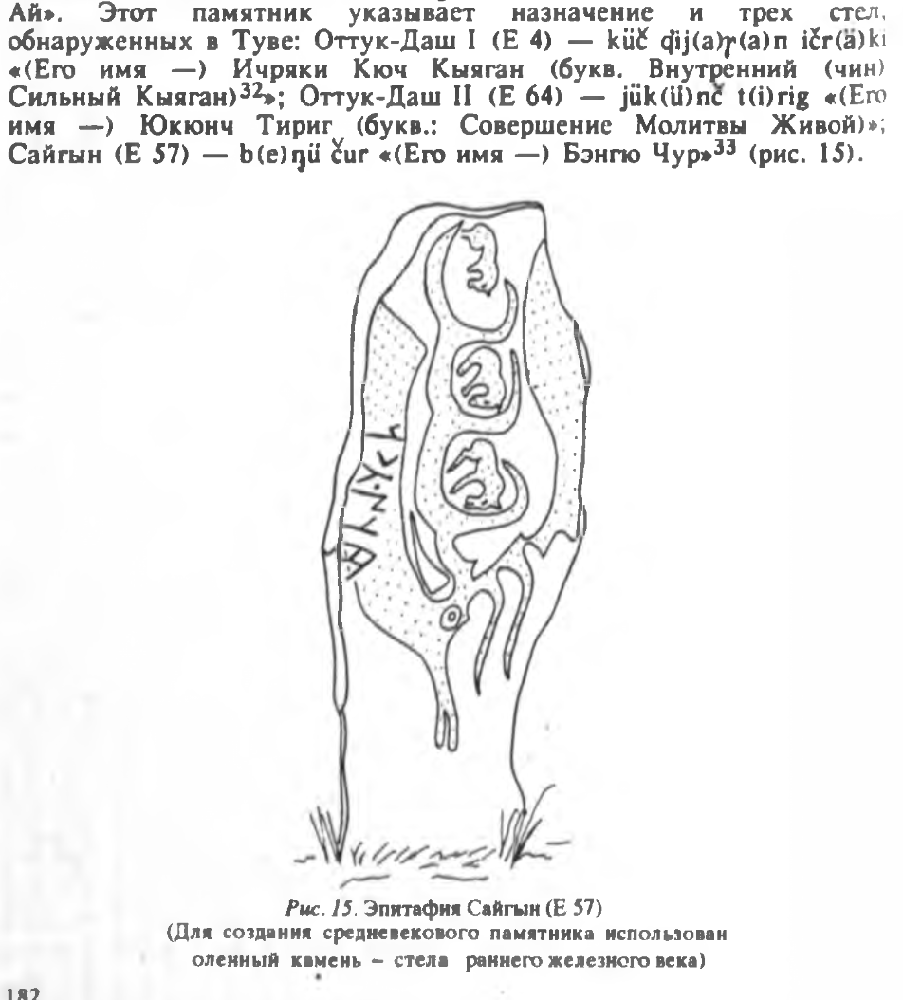

In [16]:
cv2_imshow(cv2.imread('/content/drive/MyDrive/Снимок экрана 2023-05-08 в 01.23.56.png'))

In [ ]:
image_path = "/content/drive/MyDrive/example9.png"
recognize_symbols(image_path)

In [30]:
image_paths = ["/content/drive/MyDrive/examples/example1.png",
               '/content/drive/MyDrive/examples/example2.png',
               '/content/drive/MyDrive/examples/example3.png',
               '/content/drive/MyDrive/examples/example4.png',
               '/content/drive/MyDrive/examples/example5.png',
               '/content/drive/MyDrive/examples/example6.png',
               '/content/drive/MyDrive/examples/example7.png',
               '/content/drive/MyDrive/examples/example8.png',
               '/content/drive/MyDrive/examples/example9.png',
               '/content/drive/MyDrive/examples/example10.png',
               "/content/drive/MyDrive/examples/example11.png",
               '/content/drive/MyDrive/examples/example12.png',
               '/content/drive/MyDrive/examples/example13.png',
               '/content/drive/MyDrive/examples/example14.png',
               '/content/drive/MyDrive/examples/example15.png',
               '/content/drive/MyDrive/examples/example16.png',
               '/content/drive/MyDrive/examples/example17.png',
               '/content/drive/MyDrive/examples/example18.png',
               '/content/drive/MyDrive/examples/example19.png',
               '/content/drive/MyDrive/examples/example20.png'
               ]


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


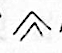

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


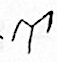

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


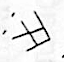

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


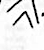

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


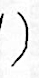

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


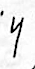

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


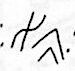

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


Символ распознан правильно? (y/n): 


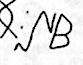

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


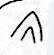

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


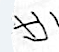

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


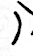

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


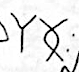

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


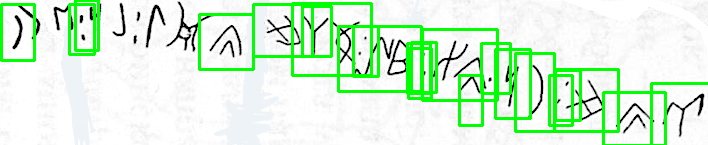

_________________________________________________


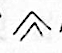

Предсказанное значение символа: 35
_________________________________________________


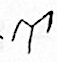

Предсказанное значение символа: 31
_________________________________________________


Предсказанное значение символа: 7
_________________________________________________


Предсказанное значение символа: 28
_________________________________________________


Предсказанное значение символа: 35
_________________________________________________


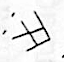

Предсказанное значение символа: 19
_________________________________________________


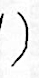

Предсказанное значение символа: 20
_________________________________________________


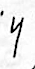

Предсказанное значение символа: 30
_________________________________________________


Предсказанное значение символа: 7
_________________________________________________


Предсказанное значение символа: 7
_________________________________________________


Предсказанное значение символа: 19
_________________________________________________


Предсказанное значение символа: 32
_________________________________________________


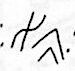

Предсказанное значение символа: 4
_________________________________________________


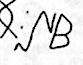

Предсказанное значение символа: 1
_________________________________________________


Предсказанное значение символа: 12
_________________________________________________


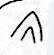

Предсказанное значение символа: 35
_________________________________________________


Предсказанное значение символа: 11
_________________________________________________


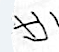

Предсказанное значение символа: 1
_________________________________________________


Предсказанное значение символа: 32
_________________________________________________


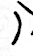

Предсказанное значение символа: 2
_________________________________________________


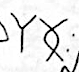

Предсказанное значение символа: 33
_________________________________________________


Предсказанное значение символа: 1
['31', '35', '35', '19', '7', '20', '30', '7', '28', '4', '32', '7', '19', '12', '1', '11', '33', '1', '35', '1', '32', '2'] Возможный перевод:  rttmdnrdq(o/u)b:dmjmizsmitmi:a


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


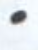

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


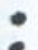

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


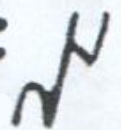

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


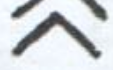

Символ распознан правильно? (y/n): 


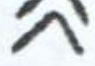

Символ распознан правильно? (y/n): 


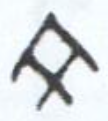

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


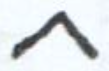

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


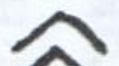

Символ распознан правильно? (y/n): 


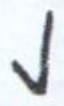

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


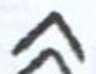

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


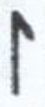

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


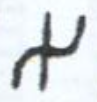

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


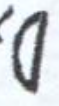

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


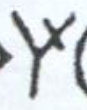

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


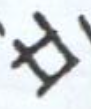

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


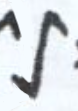

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


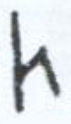

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


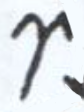

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


Символ распознан правильно? (y/n): 


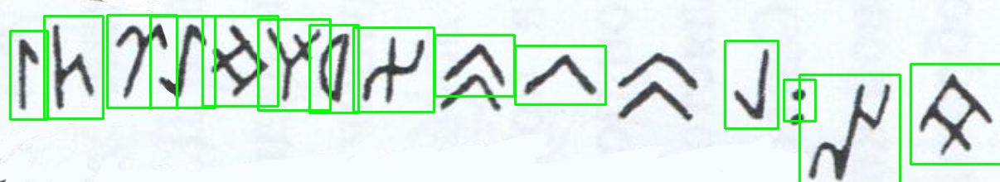

_________________________________________________


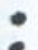

Предсказанное значение символа: 19
_________________________________________________


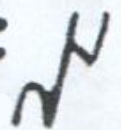

Предсказанное значение символа: 21
_________________________________________________


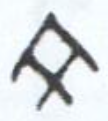

Предсказанное значение символа: 4
_________________________________________________


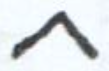

Предсказанное значение символа: 39
_________________________________________________


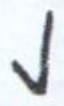

Предсказанное значение символа: 16
_________________________________________________


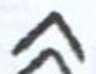

Предсказанное значение символа: 35
_________________________________________________


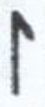

Предсказанное значение символа: 40
_________________________________________________


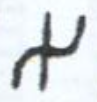

Предсказанное значение символа: 11
_________________________________________________


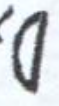

Предсказанное значение символа: 12
_________________________________________________


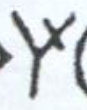

Предсказанное значение символа: 38
_________________________________________________


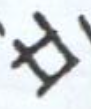

Предсказанное значение символа: 19
_________________________________________________


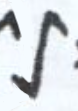

Предсказанное значение символа: 2
_________________________________________________


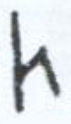

Предсказанное значение символа: 36
_________________________________________________


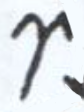

Предсказанное значение символа: 31
['4', '21', '19', '16', '39', '35', '11', '12', '38', '19', '2', '31', '36', '40'] Возможный перевод:  bnmlstzjsmarti


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


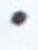

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


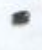

Символ распознан правильно? (y/n): 


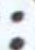

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


Символ распознан правильно? (y/n): 


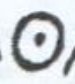

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


Символ распознан правильно? (y/n): 


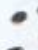

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


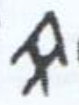

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


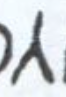

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


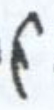

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


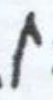

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


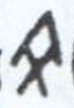

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


Символ распознан правильно? (y/n): 


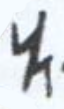

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


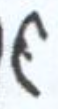

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


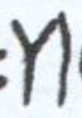

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


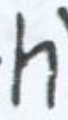

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


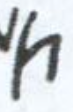

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 33ms/step


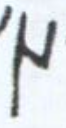

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


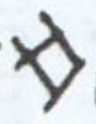

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 88ms/step


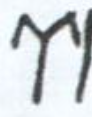

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


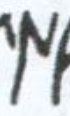

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


Символ распознан правильно? (y/n): 


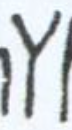

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


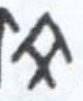

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


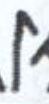

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


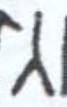

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


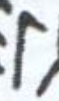

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


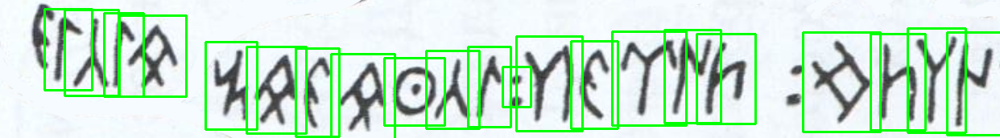

_________________________________________________


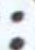

Предсказанное значение символа: 11
_________________________________________________


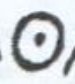

Предсказанное значение символа: 22
_________________________________________________


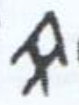

Предсказанное значение символа: 4
_________________________________________________


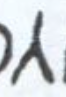

Предсказанное значение символа: 37
_________________________________________________


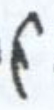

Предсказанное значение символа: 6
_________________________________________________


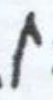

Предсказанное значение символа: 9
_________________________________________________


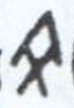

Предсказанное значение символа: 4
_________________________________________________


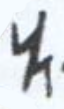

Предсказанное значение символа: 1
_________________________________________________


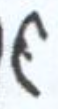

Предсказанное значение символа: 6
_________________________________________________


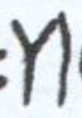

Предсказанное значение символа: 30
_________________________________________________


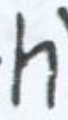

Предсказанное значение символа: 36
_________________________________________________


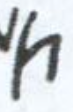

Предсказанное значение символа: 35
_________________________________________________


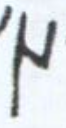

Предсказанное значение символа: 9
_________________________________________________


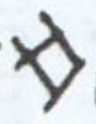

Предсказанное значение символа: 19
_________________________________________________


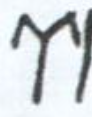

Предсказанное значение символа: 31
_________________________________________________


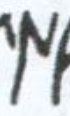

Предсказанное значение символа: 8
_________________________________________________


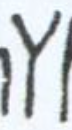

Предсказанное значение символа: 18
_________________________________________________


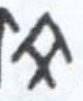

Предсказанное значение символа: 4
_________________________________________________


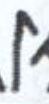

Предсказанное значение символа: 12
_________________________________________________


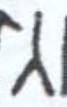

Предсказанное значение символа: 37
_________________________________________________


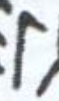

Предсказанное значение символа: 40
['9', '18', '36', '19', '35', '8', '31', '6', '30', '11', '9', '37', '22', '4', '6', '4', '1', '4', '12', '37', '40'] Возможный перевод:  ulttmtdrgrzucntbgbmibjci


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


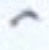

Символ распознан правильно? (y/n): 


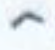

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


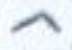

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 24ms/step


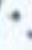

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


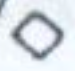

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


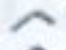

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 50ms/step


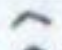

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


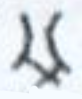

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


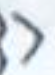

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


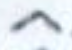

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


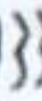

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 76ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


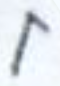

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


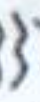

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 33ms/step


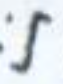

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


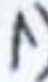

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


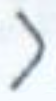

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


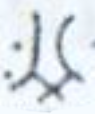

Символ распознан правильно? (y/n): 


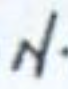

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


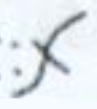

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


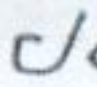

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


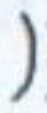

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


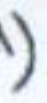

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 52ms/step


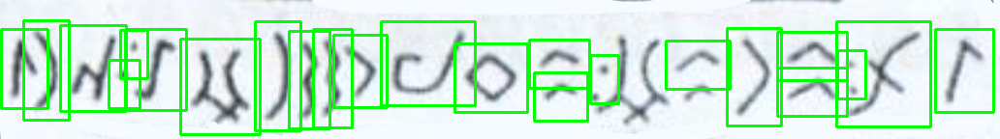

_________________________________________________


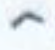

Предсказанное значение символа: 31
_________________________________________________


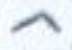

Предсказанное значение символа: 35
_________________________________________________


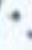

Предсказанное значение символа: 21
_________________________________________________


Предсказанное значение символа: 38
_________________________________________________


Предсказанное значение символа: 1
_________________________________________________


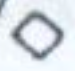

Предсказанное значение символа: 25
_________________________________________________


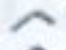

Предсказанное значение символа: 35
_________________________________________________


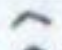

Предсказанное значение символа: 35
_________________________________________________


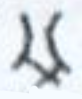

Предсказанное значение символа: 42
_________________________________________________


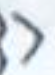

Предсказанное значение символа: 19
_________________________________________________


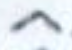

Предсказанное значение символа: 39
_________________________________________________


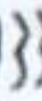

Предсказанное значение символа: 7
_________________________________________________


Предсказанное значение символа: 21
_________________________________________________


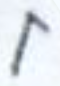

Предсказанное значение символа: 40
_________________________________________________


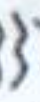

Предсказанное значение символа: 10
_________________________________________________


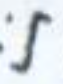

Предсказанное значение символа: 2
_________________________________________________


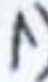

Предсказанное значение символа: 6
_________________________________________________


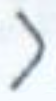

Предсказанное значение символа: 27
_________________________________________________


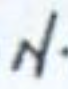

Предсказанное значение символа: 21
_________________________________________________


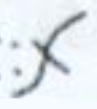

Предсказанное значение символа: 8
_________________________________________________


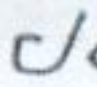

Предсказанное значение символа: 11
_________________________________________________


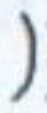

Предсказанное значение символа: 20
_________________________________________________


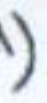

Предсказанное значение символа: 20
['40', '1', '8', '39', '35', '27', '35', '38', '31', '35', '25', '11', '19', '10', '7', '20', '42', '2', '21', '21', '21', '20', '6'] Возможный перевод:  imidstutsrtndzmkodnaannnng


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


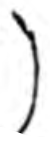

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


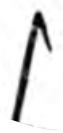

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 32ms/step


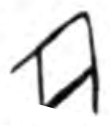

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


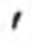

Символ распознан правильно? (y/n): 


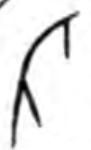

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


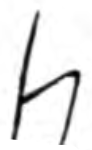

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


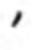

Символ распознан правильно? (y/n): 


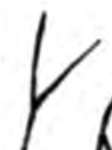

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


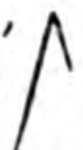

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 65ms/step


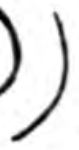

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


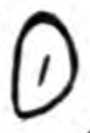

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


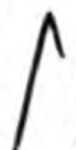

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


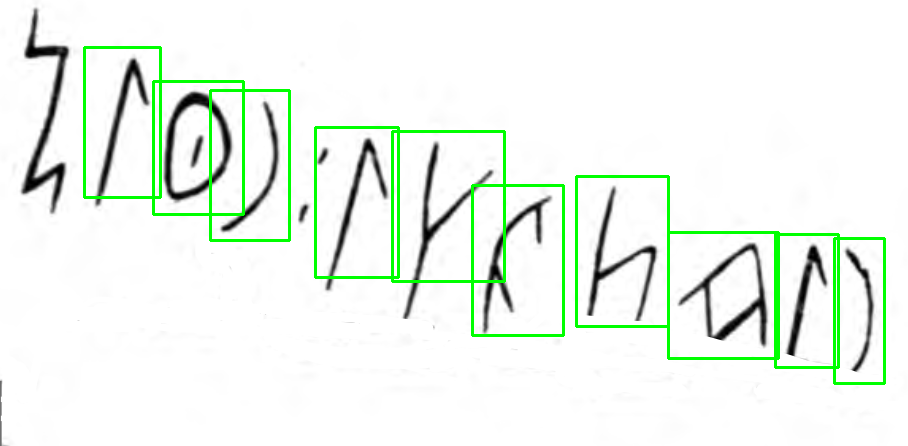

_________________________________________________


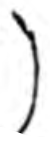

Предсказанное значение символа: 20
_________________________________________________


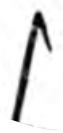

Предсказанное значение символа: 40
_________________________________________________


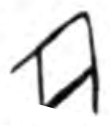

Предсказанное значение символа: 42
_________________________________________________


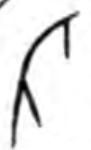

Предсказанное значение символа: 18
_________________________________________________


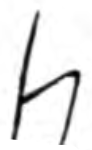

Предсказанное значение символа: 4
_________________________________________________


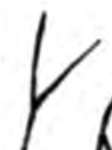

Предсказанное значение символа: 23
_________________________________________________


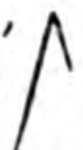

Предсказанное значение символа: 40
_________________________________________________


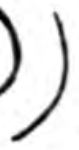

Предсказанное значение символа: 20
_________________________________________________


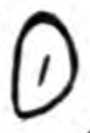

Предсказанное значение символа: 25
_________________________________________________


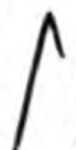

Предсказанное значение символа: 40
['20', '40', '42', '4', '18', '23', '40', '20', '25', '40'] Возможный перевод:  niabltl(ng)inndi


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


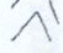

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


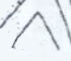

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


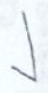

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


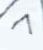

Символ распознан правильно? (y/n): 


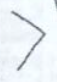

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): 


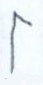

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 50ms/step


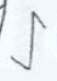

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


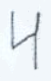

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


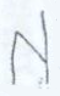

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


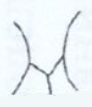

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


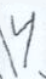

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): 


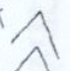

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


Символ распознан правильно? (y/n): 


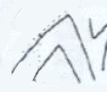

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 45ms/step


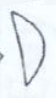

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


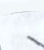

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


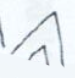

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 50ms/step


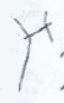

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


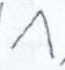

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


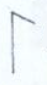

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): 


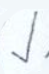

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


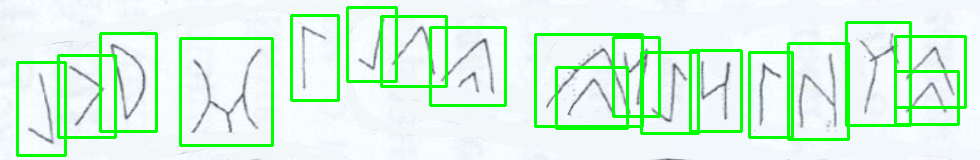

_________________________________________________


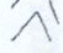

Предсказанное значение символа: 35
_________________________________________________


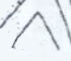

Предсказанное значение символа: 35
_________________________________________________


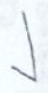

Предсказанное значение символа: 16
_________________________________________________


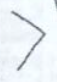

Предсказанное значение символа: 27
_________________________________________________


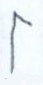

Предсказанное значение символа: 40
_________________________________________________


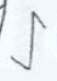

Предсказанное значение символа: 2
_________________________________________________


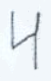

Предсказанное значение символа: 30
_________________________________________________


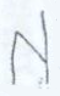

Предсказанное значение символа: 14
_________________________________________________


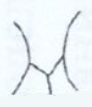

Предсказанное значение символа: 5
_________________________________________________


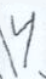

Предсказанное значение символа: 30
_________________________________________________


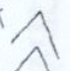

Предсказанное значение символа: 35
_________________________________________________


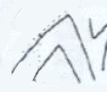

Предсказанное значение символа: 35
_________________________________________________


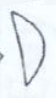

Предсказанное значение символа: 12
_________________________________________________


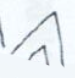

Предсказанное значение символа: 35
_________________________________________________


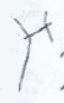

Предсказанное значение символа: 38
_________________________________________________


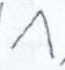

Предсказанное значение символа: 39
_________________________________________________


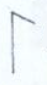

Предсказанное значение символа: 40
_________________________________________________


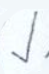

Предсказанное значение символа: 16
['35', '35', '38', '14', '40', '30', '2', '30', '35', '35', '35', '39', '16', '40', '5', '12', '27', '16'] Возможный перевод:  ttsqirartttslijjul


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


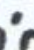

Символ распознан правильно? (y/n): 


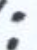

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


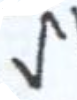

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


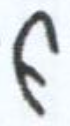

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


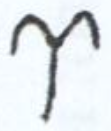

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 48ms/step


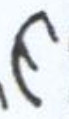

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 59ms/step


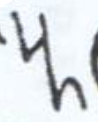

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


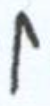

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


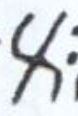

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


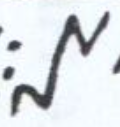

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 50ms/step


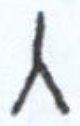

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


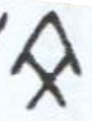

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


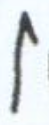

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


Символ распознан правильно? (y/n): 


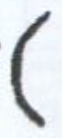

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


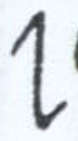

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


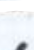

Символ распознан правильно? (y/n): 


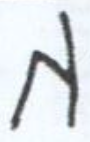

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 80ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


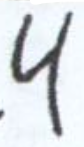

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 49ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


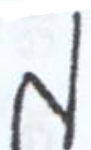

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 51ms/step


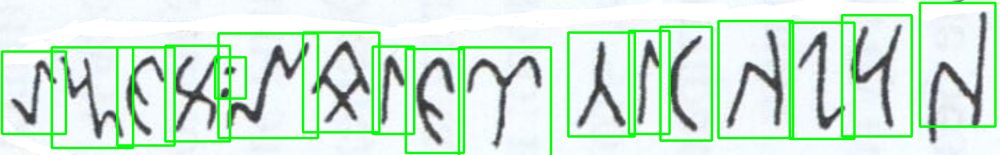

_________________________________________________


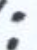

Предсказанное значение символа: 7
_________________________________________________


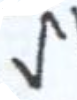

Предсказанное значение символа: 2
_________________________________________________


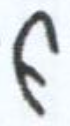

Предсказанное значение символа: 1
_________________________________________________


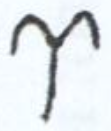

Предсказанное значение символа: 31
_________________________________________________


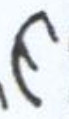

Предсказанное значение символа: 1
_________________________________________________


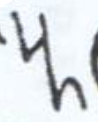

Предсказанное значение символа: 21
_________________________________________________


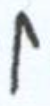

Предсказанное значение символа: 9
_________________________________________________


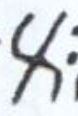

Предсказанное значение символа: 7
_________________________________________________


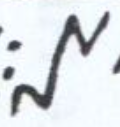

Предсказанное значение символа: 21
_________________________________________________


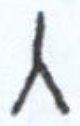

Предсказанное значение символа: 37
_________________________________________________


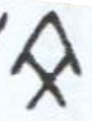

Предсказанное значение символа: 4
_________________________________________________


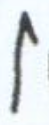

Предсказанное значение символа: 40
_________________________________________________


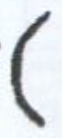

Предсказанное значение символа: 42
_________________________________________________


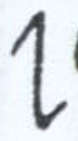

Предсказанное значение символа: 2
_________________________________________________


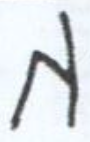

Предсказанное значение символа: 14
_________________________________________________


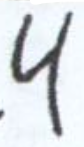

Предсказанное значение символа: 30
_________________________________________________


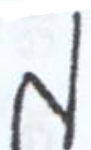

Предсказанное значение символа: 37
['37', '30', '2', '14', '42', '40', '37', '31', '1', '9', '4', '21', '7', '7', '1', '21', '2'] Возможный перевод:  craqaicrmiubnddmina


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


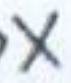

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 67ms/step


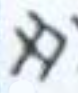

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 53ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 59ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 59ms/step


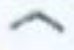

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 53ms/step


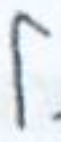

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


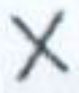

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


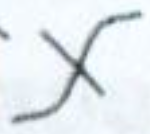

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 56ms/step


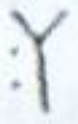

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 54ms/step


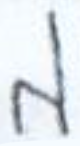

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 49ms/step


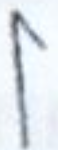

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 64ms/step


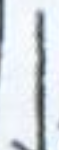

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 61ms/step


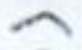

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


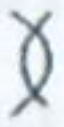

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 49ms/step


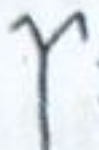

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


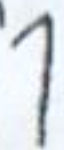

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 77ms/step


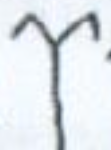

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


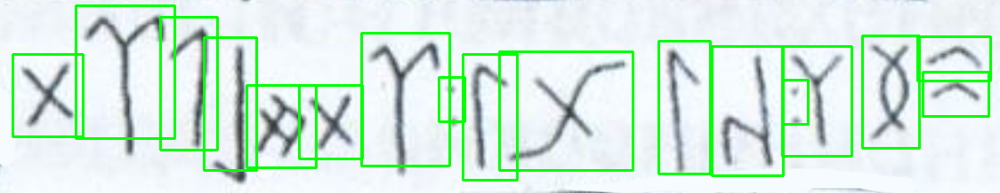

_________________________________________________


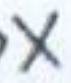

Предсказанное значение символа: 8
_________________________________________________


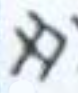

Предсказанное значение символа: 19
_________________________________________________


Предсказанное значение символа: 11
_________________________________________________


Предсказанное значение символа: 19
_________________________________________________


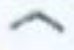

Предсказанное значение символа: 39
_________________________________________________


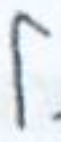

Предсказанное значение символа: 31
_________________________________________________


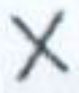

Предсказанное значение символа: 8
_________________________________________________


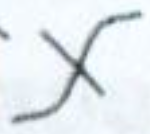

Предсказанное значение символа: 38
_________________________________________________


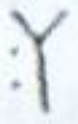

Предсказанное значение символа: 17
_________________________________________________


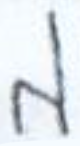

Предсказанное значение символа: 37
_________________________________________________


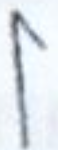

Предсказанное значение символа: 40
_________________________________________________


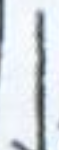

Предсказанное значение символа: 30
_________________________________________________


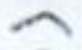

Предсказанное значение символа: 39
_________________________________________________


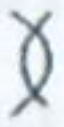

Предсказанное значение символа: 42
_________________________________________________


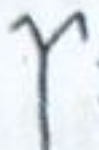

Предсказанное значение символа: 31
_________________________________________________


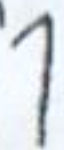

Предсказанное значение символа: 30
_________________________________________________


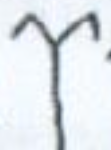

Предсказанное значение символа: 31
['39', '39', '42', '17', '11', '37', '40', '38', '31', '19', '31', '8', '19', '30', '30', '31', '8'] Возможный перевод:  ssang(l)zcisrmrdmrrrd


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


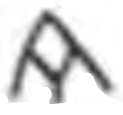

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 63ms/step


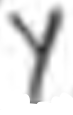

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


Символ распознан правильно? (y/n): 


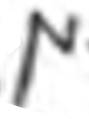

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 45ms/step


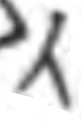

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


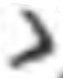

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 65ms/step


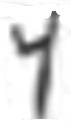

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


Символ распознан правильно? (y/n): 


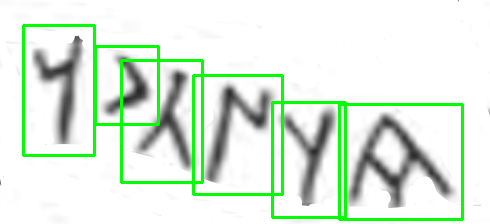

_________________________________________________


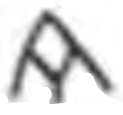

Предсказанное значение символа: 4
_________________________________________________


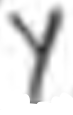

Предсказанное значение символа: 38
_________________________________________________


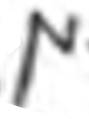

Предсказанное значение символа: 9
_________________________________________________


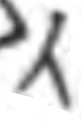

Предсказанное значение символа: 37
_________________________________________________


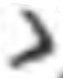

Предсказанное значение символа: 27
_________________________________________________


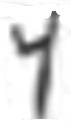

Предсказанное значение символа: 30
['4', '38', '9', '37', '27', '30'] Возможный перевод:  bsucur


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


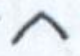

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 49ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 64ms/step


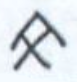

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


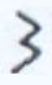

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 33ms/step


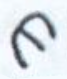

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


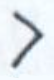

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


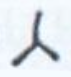

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


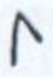

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


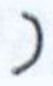

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


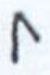

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


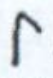

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


Символ распознан правильно? (y/n): 


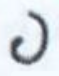

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


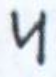

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


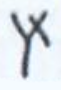

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 62ms/step


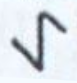

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


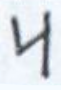

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


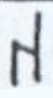

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


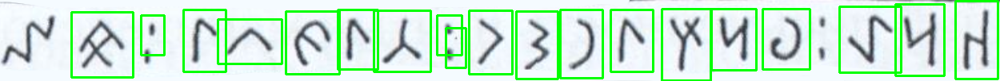

_________________________________________________


Предсказанное значение символа: 35
_________________________________________________


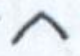

Предсказанное значение символа: 35
_________________________________________________


Предсказанное значение символа: 11
_________________________________________________


Предсказанное значение символа: 42
_________________________________________________


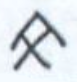

Предсказанное значение символа: 4
_________________________________________________


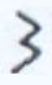

Предсказанное значение символа: 7
_________________________________________________


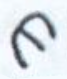

Предсказанное значение символа: 6
_________________________________________________


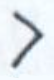

Предсказанное значение символа: 27
_________________________________________________


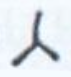

Предсказанное значение символа: 37
_________________________________________________


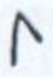

Предсказанное значение символа: 9
_________________________________________________


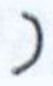

Предсказанное значение символа: 20
_________________________________________________


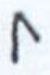

Предсказанное значение символа: 40
_________________________________________________


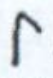

Предсказанное значение символа: 9
_________________________________________________


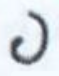

Предсказанное значение символа: 3
_________________________________________________


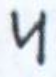

Предсказанное значение символа: 30
_________________________________________________


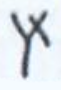

Предсказанное значение символа: 38
_________________________________________________


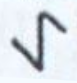

Предсказанное значение символа: 2
_________________________________________________


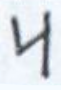

Предсказанное значение символа: 30
_________________________________________________


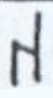

Предсказанное значение символа: 14
['14', '30', '2', '3', '30', '38', '9', '20', '7', '27', '35', '11', '37', '40', '6', '35', '9', '42', '4'] Возможный перевод:  qrab(e)rsundutzcigtuab


Символ распознан правильно? (y/n): 


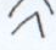

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


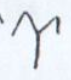

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


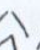

Символ распознан правильно? (y/n): 


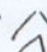

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


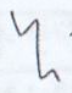

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


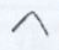

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


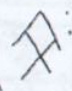

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


Символ распознан правильно? (y/n): 


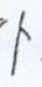

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


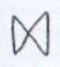

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


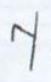

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


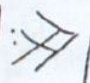

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


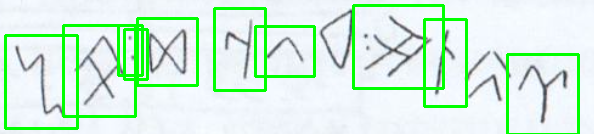

_________________________________________________


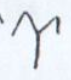

Предсказанное значение символа: 31
_________________________________________________


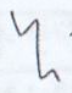

Предсказанное значение символа: 29
_________________________________________________


Предсказанное значение символа: 1
_________________________________________________


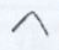

Предсказанное значение символа: 39
_________________________________________________


Предсказанное значение символа: 7
_________________________________________________


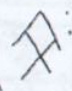

Предсказанное значение символа: 4
_________________________________________________


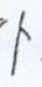

Предсказанное значение символа: 35
_________________________________________________


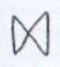

Предсказанное значение символа: 8
_________________________________________________


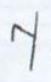

Предсказанное значение символа: 30
_________________________________________________


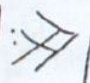

Предсказанное значение символа: 19
['31', '35', '19', '39', '30', '8', '1', '7', '4', '29'] Возможный перевод:  rtmsrdmidbp


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


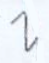

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 61ms/step


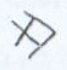

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


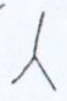

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


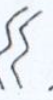

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


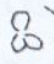

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


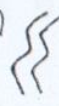

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


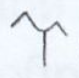

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 51ms/step


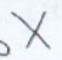

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 48ms/step


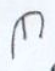

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


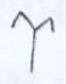

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


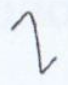

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


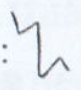

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 48ms/step


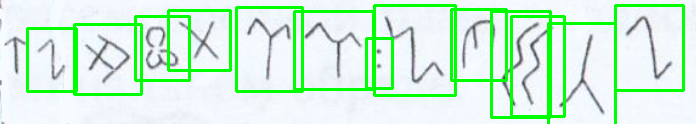

_________________________________________________


Предсказанное значение символа: 11
_________________________________________________


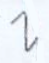

Предсказанное значение символа: 2
_________________________________________________


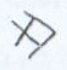

Предсказанное значение символа: 19
_________________________________________________


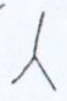

Предсказанное значение символа: 37
_________________________________________________


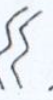

Предсказанное значение символа: 6
_________________________________________________


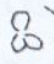

Предсказанное значение символа: 1
_________________________________________________


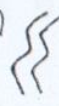

Предсказанное значение символа: 2
_________________________________________________


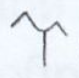

Предсказанное значение символа: 31
_________________________________________________


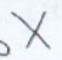

Предсказанное значение символа: 8
_________________________________________________


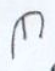

Предсказанное значение символа: 6
_________________________________________________


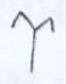

Предсказанное значение символа: 31
_________________________________________________


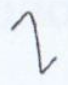

Предсказанное значение символа: 2
_________________________________________________


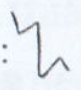

Предсказанное значение символа: 2
['2', '37', '6', '2', '6', '2', '11', '31', '31', '8', '1', '19', '2'] Возможный перевод:  acgagazrrdmima


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


Символ распознан правильно? (y/n): 


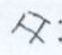

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


Символ распознан правильно? (y/n): 


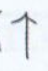

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


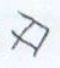

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


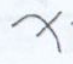

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


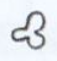

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


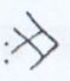

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


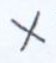

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


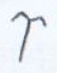

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


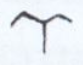

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 58ms/step


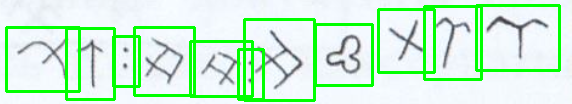

_________________________________________________


Предсказанное значение символа: 7
_________________________________________________


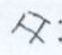

Предсказанное значение символа: 4
_________________________________________________


Предсказанное значение символа: 4
_________________________________________________


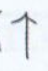

Предсказанное значение символа: 28
_________________________________________________


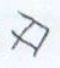

Предсказанное значение символа: 19
_________________________________________________


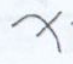

Предсказанное значение символа: 31
_________________________________________________


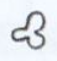

Предсказанное значение символа: 1
_________________________________________________


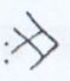

Предсказанное значение символа: 19
_________________________________________________


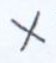

Предсказанное значение символа: 7
_________________________________________________


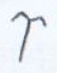

Предсказанное значение символа: 28
_________________________________________________


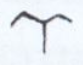

Предсказанное значение символа: 31
['31', '28', '7', '1', '19', '7', '4', '19', '4', '28', '31'] Возможный перевод:  rq(o/u)dmimdbmbq(o/u)r


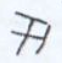

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


Символ распознан правильно? (y/n): 


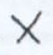

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 56ms/step


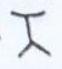

Символ распознан правильно? (y/n): 


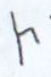

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


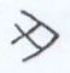

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


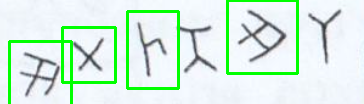

_________________________________________________


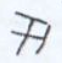

Предсказанное значение символа: 19
_________________________________________________


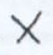

Предсказанное значение символа: 7
_________________________________________________


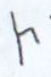

Предсказанное значение символа: 11
_________________________________________________


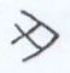

Предсказанное значение символа: 19
['19', '11', '7', '19'] Возможный перевод:  mzdm


Символ распознан правильно? (y/n): 


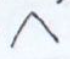

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


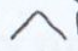

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


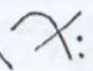

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


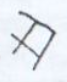

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


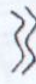

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


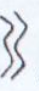

Символ распознан правильно? (y/n): 


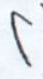

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


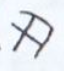

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


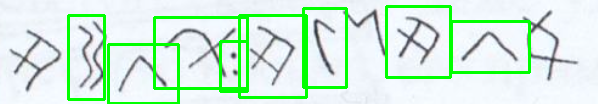

_________________________________________________


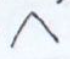

Предсказанное значение символа: 39
_________________________________________________


Предсказанное значение символа: 19
_________________________________________________


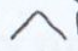

Предсказанное значение символа: 39
_________________________________________________


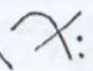

Предсказанное значение символа: 8
_________________________________________________


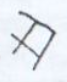

Предсказанное значение символа: 19
_________________________________________________


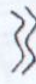

Предсказанное значение символа: 7
_________________________________________________


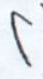

Предсказанное значение символа: 4
_________________________________________________


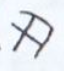

Предсказанное значение символа: 19
['39', '19', '4', '19', '19', '8', '39', '7'] Возможный перевод:  smbmmdsd


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


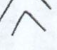

Символ распознан правильно? (y/n): 


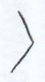

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


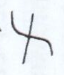

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


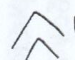

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


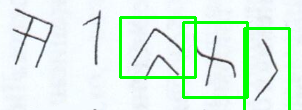

_________________________________________________


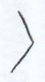

Предсказанное значение символа: 27
_________________________________________________


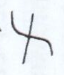

Предсказанное значение символа: 11
_________________________________________________


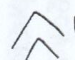

Предсказанное значение символа: 35
['27', '11', '35'] Возможный перевод:  uzt


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


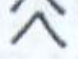

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


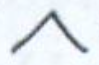

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 54ms/step


Символ распознан правильно? (y/n): 


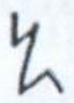

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 57ms/step


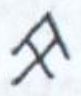

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 38ms/step


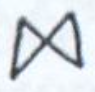

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


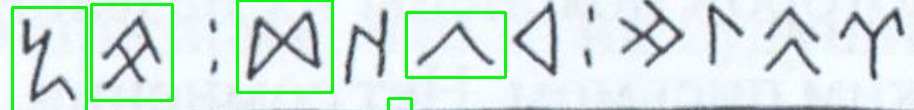

_________________________________________________


Предсказанное значение символа: 21
_________________________________________________


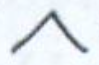

Предсказанное значение символа: 35
_________________________________________________


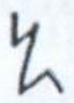

Предсказанное значение символа: 36
_________________________________________________


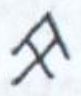

Предсказанное значение символа: 4
_________________________________________________


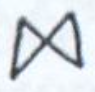

Предсказанное значение символа: 8
['35', '21', '8', '4', '36'] Возможный перевод:  tndbt


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


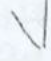

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


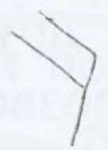

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


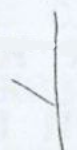

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 89ms/step


Символ распознан правильно? (y/n): 


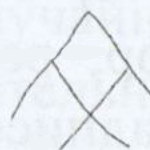

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


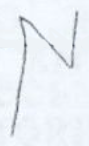

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


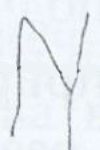

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 48ms/step


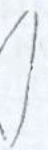

Символ распознан правильно? (y/n): 


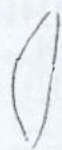

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


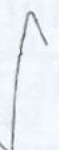

Символ распознан правильно? (y/n): 


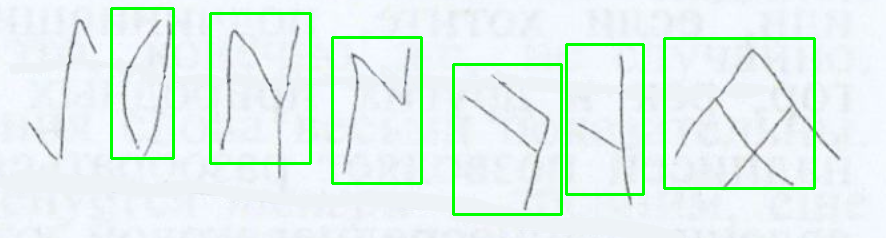

_________________________________________________


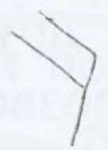

Предсказанное значение символа: 19
_________________________________________________


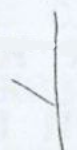

Предсказанное значение символа: 37
_________________________________________________


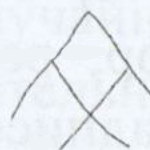

Предсказанное значение символа: 4
_________________________________________________


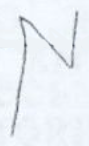

Предсказанное значение символа: 9
_________________________________________________


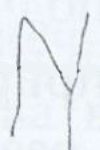

Предсказанное значение символа: 18
_________________________________________________


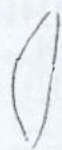

Предсказанное значение символа: 6
['4', '37', '19', '9', '18', '6'] Возможный перевод:  bcmultg


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


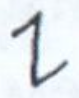

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


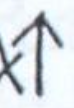

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 46ms/step


Символ распознан правильно? (y/n): 


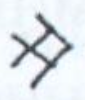

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 35ms/step


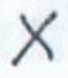

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 54ms/step


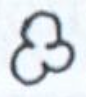

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


Символ распознан правильно? (y/n): 


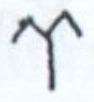

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


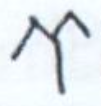

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 47ms/step


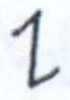

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 53ms/step


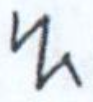

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


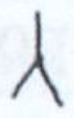

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


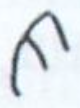

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


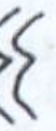

Символ распознан правильно? (y/n): 


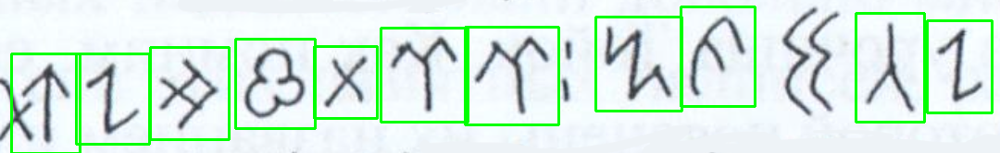

_________________________________________________


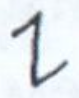

Предсказанное значение символа: 2
_________________________________________________


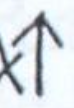

Предсказанное значение символа: 28
_________________________________________________


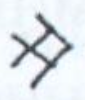

Предсказанное значение символа: 19
_________________________________________________


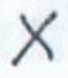

Предсказанное значение символа: 8
_________________________________________________


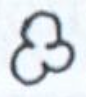

Предсказанное значение символа: 1
_________________________________________________


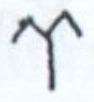

Предсказанное значение символа: 31
_________________________________________________


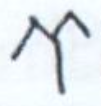

Предсказанное значение символа: 31
_________________________________________________


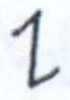

Предсказанное значение символа: 2
_________________________________________________


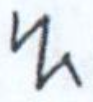

Предсказанное значение символа: 29
_________________________________________________


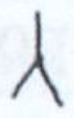

Предсказанное значение символа: 37
_________________________________________________


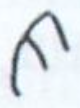

Предсказанное значение символа: 4
['2', '37', '4', '29', '31', '31', '8', '1', '19', '2', '28'] Возможный перевод:  acbprrdmimaq(o/u)


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 36ms/step


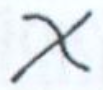

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


Символ распознан правильно? (y/n): 


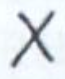

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 34ms/step


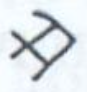

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 45ms/step


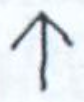

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 37ms/step


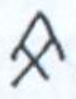

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 48ms/step


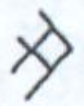

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


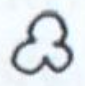

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 40ms/step


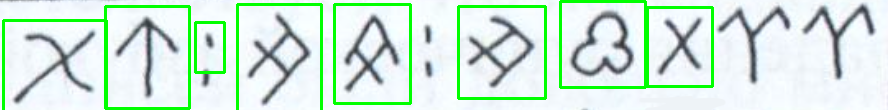

_________________________________________________


Предсказанное значение символа: 11
_________________________________________________


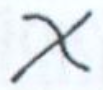

Предсказанное значение символа: 8
_________________________________________________


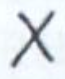

Предсказанное значение символа: 8
_________________________________________________


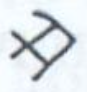

Предсказанное значение символа: 19
_________________________________________________


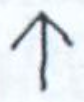

Предсказанное значение символа: 28
_________________________________________________


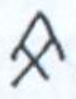

Предсказанное значение символа: 4
_________________________________________________


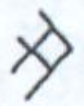

Предсказанное значение символа: 19
_________________________________________________


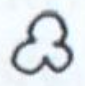

Предсказанное значение символа: 1
['8', '1', '19', '4', '19', '11', '28', '8'] Возможный перевод:  dmimbmzq(o/u)d
The most common adjacent symbol pairs are:
(1, 8)
(8, 31)
(19, 1)
(35, 35)
The most common adjacent symbol triplets are:
(19, 1, 8)


In [31]:
import csv
import os
import itertools

symbol_map = {'1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10, '11': 11, '12': 12, '13': 13, '14': 14, '15': 15, '16': 16, '17': 17, '18': 18, '19': 19, '20': 20, '21': 21, '22': 22, '23': 23, '24': 24, '25': 25, '26': 26, '27': 27, '28': 28, '29': 29, '30': 30, '31': 31, '32': 32, '33': 33, '34': 34, '35': 35, '36': 36, '37': 37, '38': 38, '39': 39, '40': 40, '41': 41, '42': 42}
recognized_symbols_list = []
for image_path in image_paths:
    recognized_symbols = [(symbol_map[symbol], bbox) for symbol, bbox in recognize_symbols(image_path)]
    recognized_symbols_list.append(recognized_symbols)

adjacent_symbols = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42]

matrix = [[0 for _ in range(len(adjacent_symbols))] for _ in range(len(adjacent_symbols))]
triplet_matrix = [[[0 for _ in range(len(adjacent_symbols))] for _ in range(len(adjacent_symbols))] for _ in range(len(adjacent_symbols))]

for symbols in itertools.product(adjacent_symbols, repeat=2):
    symbol1, symbol2 = symbols
    for recognized_symbols in recognized_symbols_list:
        for i in range(len(recognized_symbols)-1):
            if (recognized_symbols[i][0] == symbol1 and recognized_symbols[i+1][0] == symbol2):
                matrix[symbol1-1][symbol2-1] += 1
            if i < len(recognized_symbols)-2:
                symbol3 = recognized_symbols[i+2][0]
                if (recognized_symbols[i][0] in adjacent_symbols 
                    and recognized_symbols[i+1][0] in adjacent_symbols 
                    and symbol3 in adjacent_symbols):
                    triplet_matrix[recognized_symbols[i][0]-1][recognized_symbols[i+1][0]-1][symbol3-1] += 1

max_count = 0
most_common_pairs = []

for i in range(len(matrix)):
    for j in range(len(matrix[i])):
        count = matrix[i][j]
        if count > max_count:
            max_count = count
            most_common_pairs = [(i+1, j+1)]
        elif count == max_count and (i+1, j+1) not in most_common_pairs and (j+1, i+1) not in most_common_pairs:
            most_common_pairs.append((i+1, j+1))

max_count = 0
most_common_triplets = []

for i in range(len(triplet_matrix)):
    for j in range(len(triplet_matrix[i])):
        for k in range(len(triplet_matrix[i][j])):
            count = triplet_matrix[i][j][k]
            if count > max_count:
                max_count = count
                most_common_triplets = [(i+1, j+1, k+1)]
            elif count == max_count and (i+1, j+1, k+1) not in most_common_triplets:
                most_common_triplets.append((i+1, j+1, k+1))
symbol_pairs_str = ', '.join([f"({symbol_map[str(pair[0])]}, {symbol_map[str(pair[1])]}): {count}" for pair, count in zip(most_common_pairs, matrix) if count == max_count])
print("The most common adjacent symbol pairs are:")
for pair in most_common_pairs:
    print(pair)

print("The most common adjacent symbol triplets are:")
for triplet in most_common_triplets:
    print(triplet)  


         


In [57]:
cv2_imshow(cv2.imread(image_paths))


TypeError: ignored

Символ распознан правильно? (y/n): 


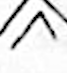

Символ распознан правильно? (y/n): 


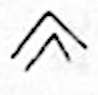

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


Символ распознан правильно? (y/n): 


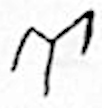

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


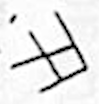

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


Символ распознан правильно? (y/n): 


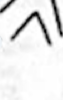

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 32ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


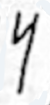

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 26ms/step


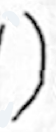

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


Символ распознан правильно? (y/n): 


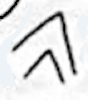

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 31ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


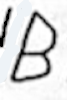

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


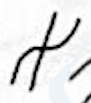

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


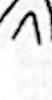

Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


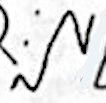

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 39ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


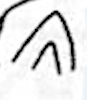

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 42ms/step


Символ распознан правильно? (y/n): 


Символ распознан правильно? (y/n): 


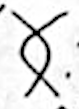

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 25ms/step


Символ распознан правильно? (y/n): 


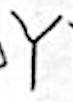

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 41ms/step


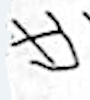

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 43ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 28ms/step


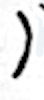

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


Символ распознан правильно? (y/n): 


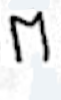

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 29ms/step


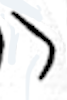

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 44ms/step


Символ распознан правильно? (y/n): 


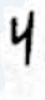

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 30ms/step


Символ распознан правильно? (y/n): 


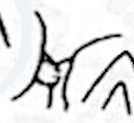

Символ распознан правильно? (y/n): y
1/1 [==============================] - 0s 27ms/step


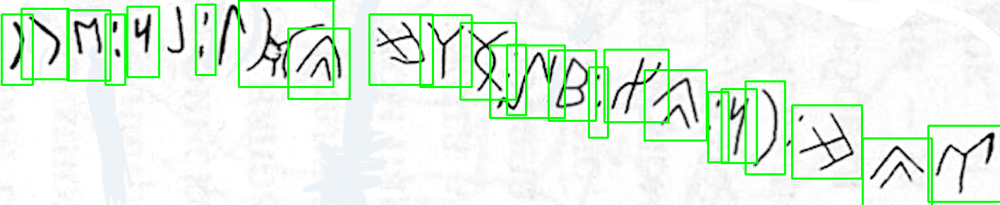

_________________________________________________


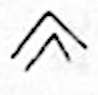

Предсказанное значение символа: 35
_________________________________________________


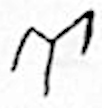

Предсказанное значение символа: 31
_________________________________________________


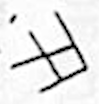

Предсказанное значение символа: 19
_________________________________________________


Предсказанное значение символа: 28
_________________________________________________


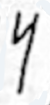

Предсказанное значение символа: 13
_________________________________________________


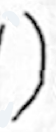

Предсказанное значение символа: 20
_________________________________________________


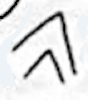

Предсказанное значение символа: 35
_________________________________________________


Предсказанное значение символа: 26
_________________________________________________


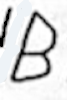

Предсказанное значение символа: 1
_________________________________________________


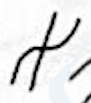

Предсказанное значение символа: 21
_________________________________________________


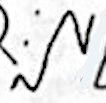

Предсказанное значение символа: 21
_________________________________________________


Предсказанное значение символа: 16
_________________________________________________


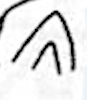

Предсказанное значение символа: 1
_________________________________________________


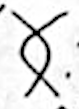

Предсказанное значение символа: 42
_________________________________________________


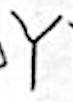

Предсказанное значение символа: 17
_________________________________________________


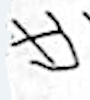

Предсказанное значение символа: 19
_________________________________________________


Предсказанное значение символа: 19
_________________________________________________


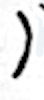

Предсказанное значение символа: 20
_________________________________________________


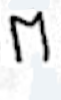

Предсказанное значение символа: 18
_________________________________________________


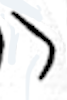

Предсказанное значение символа: 27
_________________________________________________


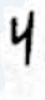

Предсказанное значение символа: 30
_________________________________________________


Предсказанное значение символа: 3
_________________________________________________


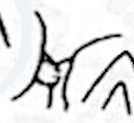

Предсказанное значение символа: 21
['31', '35', '19', '20', '13', '28', '35', '21', '26', '1', '16', '21', '42', '17', '19', '1', '21', '3', '30', '19', '18', '27', '20'] Возможный перевод:  rtmnj(i)q(o/u)tnncmilnang(l)mminb(e)rmltun


[('20', (2, 20, 44, 100)),
 ('27', (30, 12, 67, 100)),
 ('18', (95, 14, 61, 100)),
 ('19', (149, 20, 28, 100)),
 ('30', (180, 9, 45, 100)),
 ('3', (277, 6, 28, 100)),
 ('21', (338, 0, 134, 123)),
 ('1', (408, 40, 87, 100)),
 ('19', (523, 20, 90, 100)),
 ('17', (595, 21, 73, 102)),
 ('42', (652, 32, 79, 109)),
 ('21', (694, 64, 106, 103)),
 ('16', (718, 63, 27, 100)),
 ('1', (777, 71, 67, 100)),
 ('26', (834, 95, 27, 100)),
 ('21', (856, 70, 91, 103)),
 ('35', (913, 99, 88, 100)),
 ('28', (1003, 130, 29, 100)),
 ('13', (1022, 126, 50, 105)),
 ('20', (1056, 115, 56, 132)),
 ('19', (1122, 149, 99, 104)),
 ('35', (1222, 196, 98, 100)),
 ('31', (1315, 178, 105, 108))]

In [79]:
image_path = "/content/drive/MyDrive/examples/example1.png"
recognize_symbols(image_path)

In [ ]:
cv2_imshow(cv2.imread('/content/drive/MyDrive/example5result.png'))